# No-Z Robust Gate: Multi-Seed Statistical Verification

Run multiple random seeds for each optimization method (Default, Toggling, Variational),
then plot fidelity vs ε with mean ± std shading across seeds. Three verification levels:
1. Piccolo rollout (unfiltered)
2. Independent QT simulation (unfiltered)
3. Independent QT simulation (filtered, 250 MHz Gaussian)

## 1. Imports

In [40]:
import Pkg; Pkg.activate(@__DIR__); Pkg.instantiate();
Pkg.develop(path="../../QuantumCollocation.jl")
using PiccoloQuantumObjects
using QuantumCollocation
using ForwardDiff
using LinearAlgebra
using SparseArrays
using Statistics
using CairoMakie
using Random
using NamedTrajectories
using FFTW
using QuantumToolbox

const QT = QuantumToolbox

QuantumToolbox

## 2. Parameters

In [41]:
# Problem parameters
T = 100
Δt = 2.0
U_goal = GATES.H
H_drive = [PAULIS.X, PAULIS.Y]
piccolo_opts = PiccoloOptions(verbose=false)
sys = QuantumSystem(H_drive)
F = 0.9999
num_iter = 3600
hess = false
hess_iter = 100

# Control bounds (shared across all three problem types)
a_bound = 0.1 * 2 * π
da_bound = Inf
dda_bound = 1.0
Q = 25.0

# Multi-seed parameters
seeds = [1, 3, 5, 7, 9]
n_seeds = length(seeds)

# ε sweep
gen = [PAULIS.X, PAULIS.Y]
εs = collect(range(-0.03, 0.03, length=101)) 
n_eps = length(εs)

# Filter parameters
M_upsample = 20
B3dB = 250e6

2.5e8

## 3. Helper Functions

In [42]:
# Gaussian filter helpers
function flt_fftfreq(N::Int, dt_s::Float64)
    df = 1.0 / (N * dt_s)
    freqs = [k <= N ÷ 2 ? k : k - N for k in 0:N-1]
    return df .* freqs
end

function flt_gaussian_response(freqs::AbstractVector{<:Real}, B3dB_Hz::Float64)
    σf = B3dB_Hz / sqrt(log(2.0))
    return @. exp(-0.5 * (freqs^2) / σf^2)
end

function apply_gaussian_filter(u_x_coarse::AbstractVector,
                               u_y_coarse::AbstractVector;
                               dt_ns::Real, M::Int=20, B3dB_Hz::Real=250e6)
    @assert length(u_x_coarse) == length(u_y_coarse)
    dt_coarse_s = Float64(dt_ns) * 1e-9
    dt_fine_s   = dt_coarse_s / M
    dt_fine_ns  = Float64(dt_ns) / M

    u_x_zoh = repeat(u_x_coarse, inner=(M,))
    u_y_zoh = repeat(u_y_coarse, inner=(M,))
    u_zoh   = u_x_zoh .+ 1im .* u_y_zoh

    N_fine = length(u_x_zoh)
    freqs  = flt_fftfreq(N_fine, dt_fine_s)
    G      = flt_gaussian_response(freqs, Float64(B3dB_Hz))

    U_filt = G .* fft(u_zoh)
    u_out  = ifft(U_filt)

    return real.(u_out), imag.(u_out), dt_fine_ns
end

# Independent QT simulation
function qt_simulate_fidelity(u_x::AbstractVector,
                              u_y::AbstractVector,
                              dt_ns::Real,
                              ε::Real,
                              U_goal_q::QT.QuantumObject)
    N = length(u_x)
    @assert length(u_y) == N

    dt_f = Float64(dt_ns)
    T_ns = (N - 1) * dt_f
    tlist = collect(0.0:dt_f:T_ns)

    sx = QT.sigmax()
    sy = QT.sigmay()
    sz = QT.sigmaz()

    function ux_coef(p, t)
        idx = Int(floor(clamp(t, 0.0, T_ns) / dt_f)) + 1
        return u_x[idx]
    end

    function uy_coef(p, t)
        idx = Int(floor(clamp(t, 0.0, T_ns) / dt_f)) + 1
        return u_y[idx]
    end

    uz_coef(p, t) = ε

    H_t = QT.QobjEvo((
        (sx, ux_coef),
        (sy, uy_coef),
        (sz, uz_coef),
    ))

    ψ0 = QT.basis(2, 0)
    ψ1 = QT.basis(2, 1)

    sol0 = QT.sesolve(H_t, ψ0, tlist; progress_bar=Val(false))
    sol1 = QT.sesolve(H_t, ψ1, tlist; progress_bar=Val(false))

    U_mat = hcat(sol0.states[end].data, sol1.states[end].data)
    U_T   = QT.QuantumObject(U_mat)

    return abs(tr(U_goal_q' * U_T)) / 2
end

qt_simulate_fidelity (generic function with 1 method)

## 4. Multi-Seed Optimization Loop

Solve all three methods for each seed, extract controls, apply filter,
and compute all three fidelity curves (Piccolo, QT unfiltered, QT filtered).

In [43]:
outdir = "no_Z_multiseed"
mkpath(outdir)

U_goal_q = QT.QuantumObject(GATES.H)

# Storage: [n_seeds × n_eps] for each method × each verification type
F_piccolo   = zeros(3, n_seeds, n_eps)
F_qt_unfilt = zeros(3, n_seeds, n_eps)
F_qt_filt   = zeros(3, n_seeds, n_eps)

# Store trajectories for metric computation later
all_trajs = Array{NamedTrajectory}(undef, 3, n_seeds)

for (si, seed) in enumerate(seeds)
    println("\n========== Seed $seed ($si/$n_seeds) ==========")

    # --- Default ---
    Random.seed!(seed)
    def = UnitarySmoothPulseProblem(sys, U_goal, T, Δt;
        Δt_max=Δt, Δt_min=Δt,
        a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound, Q_t=1.0)
    push!(def.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, def.trajectory))
    solve!(def, max_iter=num_iter, print_level=5, options=IpoptOptions(eval_hessian=false, output_file=joinpath(outdir, "ipopt_default_seed$(seed).txt")))

    # --- Toggling ---
    Random.seed!(seed)
    varsys_bik = VariationalQuantumSystem(H_drive, [PAULIS.Z])
    Random.seed!(seed)
    add_prob = UnitaryToggleProblem(
        varsys_bik, U_goal, T, Δt;
        a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound,
        Δt_min=Δt, Δt_max=Δt,
        piccolo_options=piccolo_opts, Q=0.0, Q_t=Q)
    push!(add_prob.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, add_prob.trajectory))
    solve!(add_prob, max_iter=num_iter, print_level=5, options=IpoptOptions(eval_hessian=false, output_file=joinpath(outdir, "ipopt_toggling_seed$(seed).txt")))

    # --- Variational ---
    Random.seed!(seed)
    varsys_add = VariationalQuantumSystem(H_drive, [PAULIS.Z])
    var_count = length(varsys_add.G_vars)

    varadd_prob = UnitaryVariationalProblem(
        varsys_add, U_goal, T, Δt;
        robust_times=[[T] for _ in 1:var_count],
        Δt_min=Δt, Δt_max=Δt,
        a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound,
        Q=0.0, Q_r=Q, Q_s=0.0,
        piccolo_options=PiccoloOptions(verbose=false))

    init_traj = deepcopy(varadd_prob.trajectory)
    init_traj.Ũ⃗ .= unitary_rollout(init_traj, varsys_add)

    varadd_prob = UnitaryVariationalProblem(
        varsys_add, U_goal, T, Δt;
        robust_times=[[T] for _ in 1:var_count],
        Δt_min=Δt, Δt_max=Δt,
        init_trajectory=remove_components(init_traj, [:Ũ⃗ᵥ1]),
        a_bound=a_bound, da_bound=da_bound, dda_bound=dda_bound,
        Q=0.0, Q_r=Q, Q_s=0.0,
        piccolo_options=PiccoloOptions(verbose=false))
    push!(varadd_prob.constraints, FinalUnitaryFidelityConstraint(U_goal, :Ũ⃗, F, varadd_prob.trajectory))
    solve!(varadd_prob, max_iter=num_iter, print_level=5, options=IpoptOptions(eval_hessian=false, output_file=joinpath(outdir, "ipopt_variational_seed$(seed).txt")))

    # --- Store trajectories ---
    probs = [def, add_prob, varadd_prob]
    labels = ["Default", "Toggling", "Variational"]

    for (mi, prob) in enumerate(probs)
        all_trajs[mi, si] = deepcopy(prob.trajectory)

        ux_c = prob.trajectory.a[1, :]
        uy_c = prob.trajectory.a[2, :]
        dt_ns = Float64(prob.trajectory.Δt[1])

        ux_f, uy_f, dt_fine = apply_gaussian_filter(ux_c, uy_c;
            dt_ns=dt_ns, M=M_upsample, B3dB_Hz=B3dB)

        for (ei, ε) in enumerate(εs)
            F_piccolo[mi, si, ei] = norm(unitary_rollout_fidelity(
                prob.trajectory, QuantumSystem(ε * PAULIS.Z, gen)))
            F_qt_unfilt[mi, si, ei] = qt_simulate_fidelity(
                ux_c, uy_c, dt_ns, ε, U_goal_q)
            F_qt_filt[mi, si, ei] = qt_simulate_fidelity(
                ux_f, uy_f, dt_fine, ε, U_goal_q)
        end

        println("  $(labels[mi]): F(0) piccolo=$(F_piccolo[mi, si, n_eps÷2+1]), " *
                "qt_unfilt=$(F_qt_unfilt[mi, si, n_eps÷2+1]), " *
                "qt_filt=$(F_qt_filt[mi, si, n_eps÷2+1])")
    end
end

println("\nAll seeds complete.")

### Per-Seed Fidelity Curves

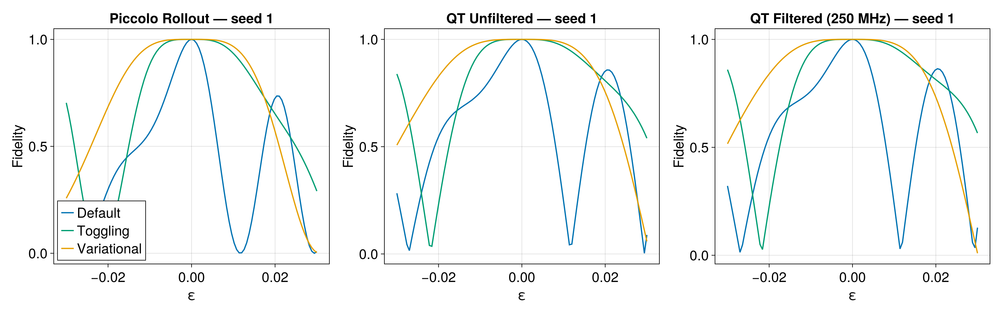

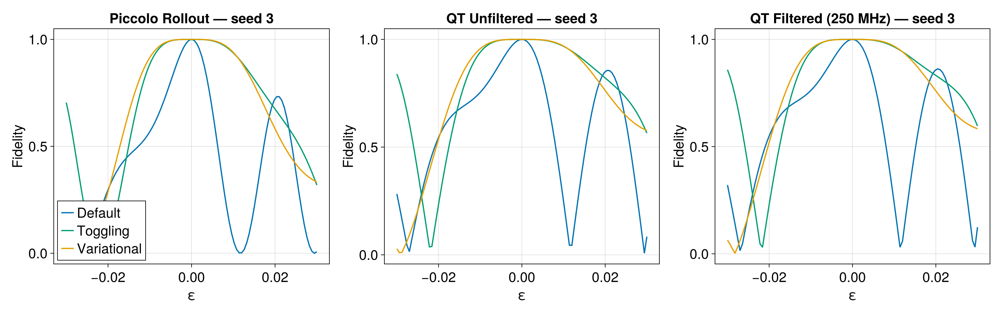

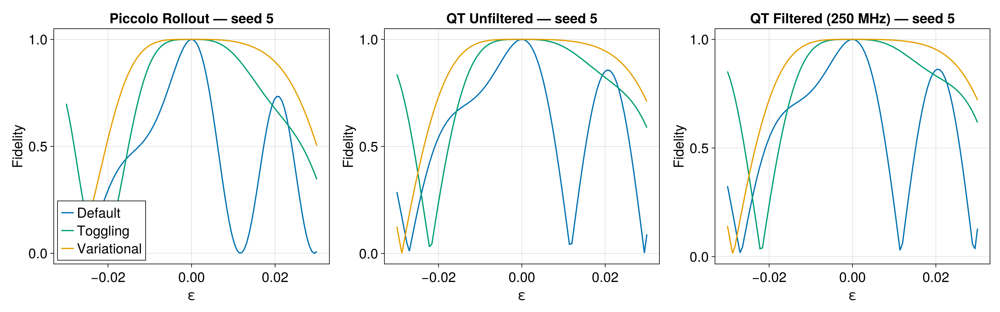

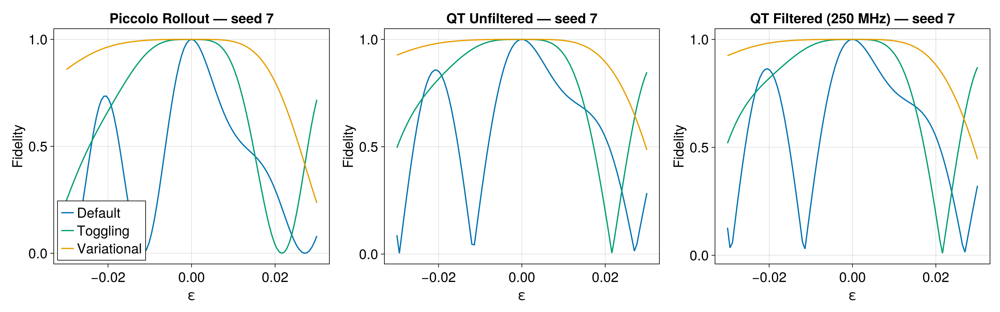

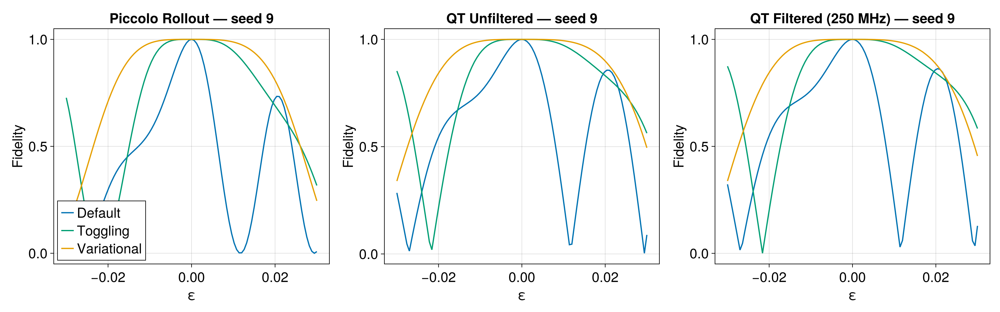

In [44]:
# Per-seed fidelity curve plots
mkpath(joinpath(outdir, "figs", "fidelity"))

for si in 1:n_seeds
    fig = Figure(fontsize=22, size=(1600, 500))

    titles = ["Piccolo Rollout", "QT Unfiltered", "QT Filtered (250 MHz)"]
    data = [F_piccolo, F_qt_unfilt, F_qt_filt]

    for (col, (title, F_data)) in enumerate(zip(titles, data))
        ax = Axis(fig[1, col], xlabel="ε", ylabel="Fidelity",
            title="$title — seed $(seeds[si])")
        for mi in 1:3
            lines!(ax, εs, vec(F_data[mi, si, :]);
                color=colors[mi], linewidth=2, label=method_labels[mi])
        end
        if col == 1
            axislegend(ax, position=:lb)
        end
    end

    save(joinpath(outdir, "figs", "fidelity", "fidelity_seed$(seeds[si]).png"), fig)
    display(fig)
end

## 5. Fidelity vs ε: Mean ± Std Shading

Each plot shows mean fidelity (solid line) with ±1 std shading across seeds.

In [45]:
function plot_fidelity_band!(ax, εs, F_data; color, label, linewidth=2)
    # F_data is [n_seeds × n_eps]
    μ = vec(mean(F_data, dims=1))
    σ = vec(std(F_data, dims=1))

    band!(ax, εs, μ .- σ, μ .+ σ; color=(color, 0.2))
    lines!(ax, εs, μ; color=color, linewidth=linewidth, label=label)
end

plot_fidelity_band! (generic function with 1 method)

### 5a. Piccolo Rollout (unfiltered)

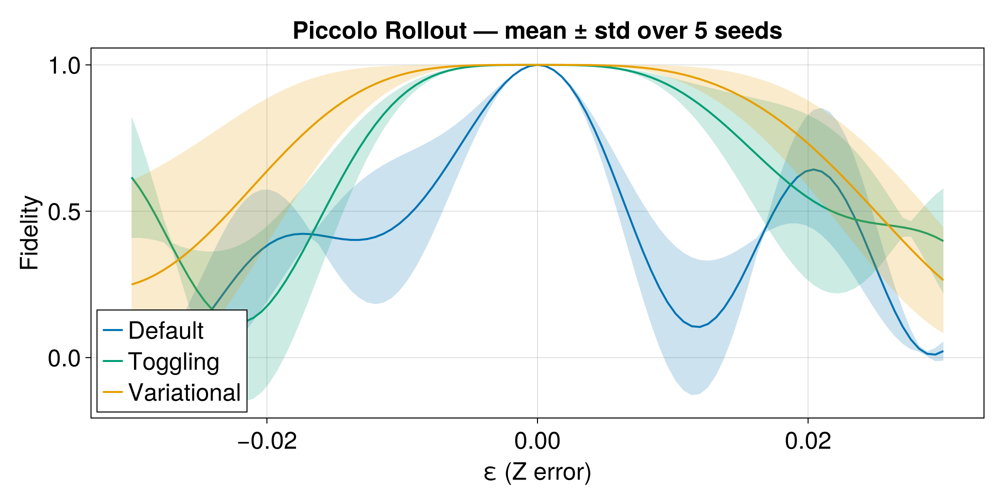

In [46]:
colors = [Makie.wong_colors()[1], Makie.wong_colors()[3], Makie.wong_colors()[2]]
method_labels = ["Default", "Toggling", "Variational"]

fig = Figure(fontsize=24, size=(1000, 500))
ax = Axis(fig[1, 1], xlabel="ε (Z error)", ylabel="Fidelity",
    title="Piccolo Rollout — mean ± std over $(n_seeds) seeds")

for mi in 1:3
    plot_fidelity_band!(ax, εs, F_piccolo[mi, :, :];
        color=colors[mi], label=method_labels[mi])
end

axislegend(ax, position=:lb)
display(fig)
save(joinpath(outdir, "figs", "piccolo_rollout_band.png"), fig)

### 5b. QT Simulation (unfiltered)

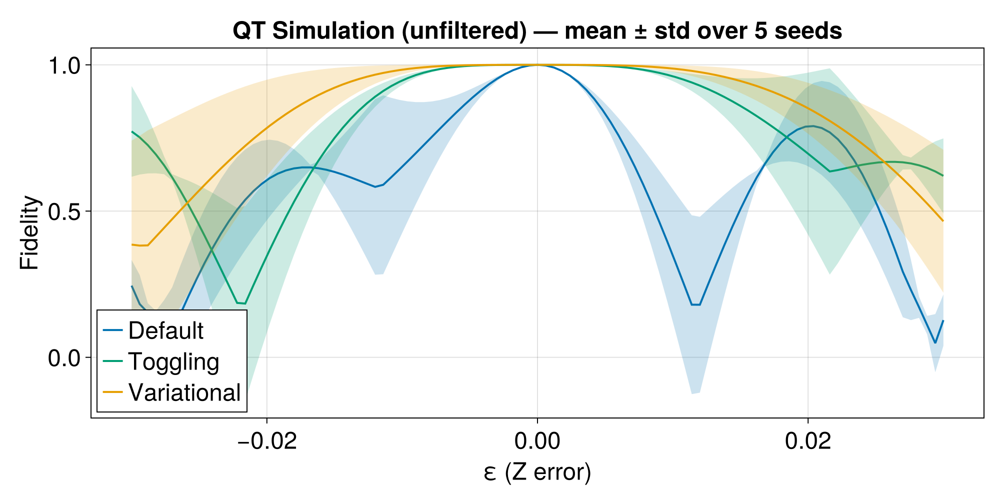

In [47]:
fig = Figure(fontsize=24, size=(1000, 500))
ax = Axis(fig[1, 1], xlabel="ε (Z error)", ylabel="Fidelity",
    title="QT Simulation (unfiltered) — mean ± std over $(n_seeds) seeds")

for mi in 1:3
    plot_fidelity_band!(ax, εs, F_qt_unfilt[mi, :, :];
        color=colors[mi], label=method_labels[mi])
end

axislegend(ax, position=:lb)
display(fig)
save(joinpath(outdir, "figs", "qt_unfilt_band.png"), fig)

### 5c. QT Simulation (filtered, 250 MHz Gaussian)

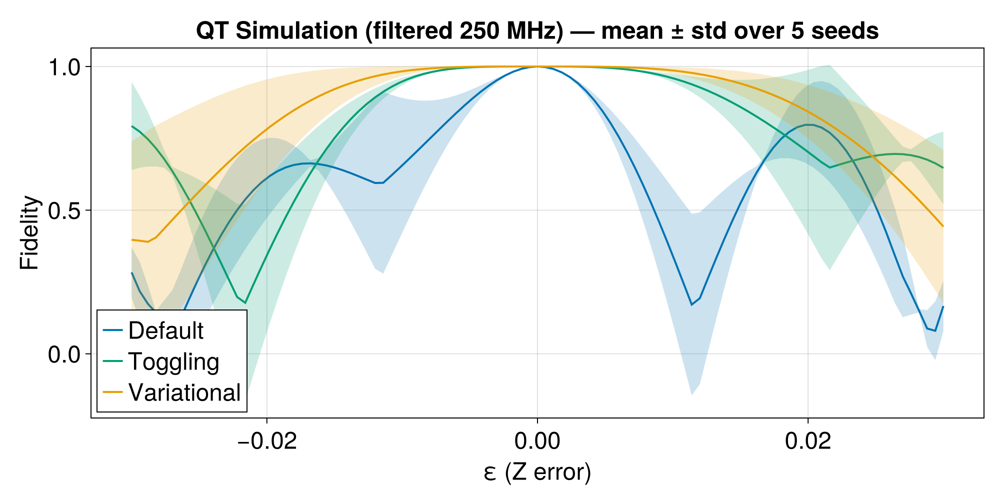

In [48]:
fig = Figure(fontsize=24, size=(1000, 500))
ax = Axis(fig[1, 1], xlabel="ε (Z error)", ylabel="Fidelity",
    title="QT Simulation (filtered 250 MHz) — mean ± std over $(n_seeds) seeds")

for mi in 1:3
    plot_fidelity_band!(ax, εs, F_qt_filt[mi, :, :];
        color=colors[mi], label=method_labels[mi])
end

axislegend(ax, position=:lb)
display(fig)
save(joinpath(outdir, "figs", "qt_filt_band.png"), fig)

### 5d. All Three Verification Types (side by side)

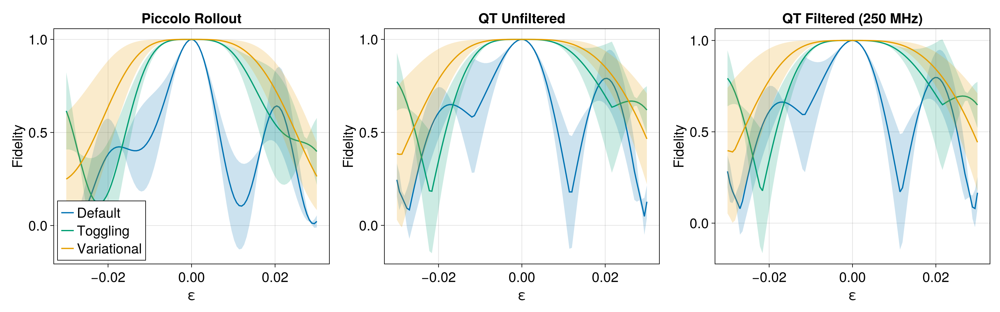

In [49]:
fig = Figure(fontsize=22, size=(1600, 500))

titles = ["Piccolo Rollout", "QT Unfiltered", "QT Filtered (250 MHz)"]
data = [F_piccolo, F_qt_unfilt, F_qt_filt]

for (col, (title, F_data)) in enumerate(zip(titles, data))
    ax = Axis(fig[1, col], xlabel="ε", ylabel="Fidelity", title=title)
    for mi in 1:3
        plot_fidelity_band!(ax, εs, F_data[mi, :, :];
            color=colors[mi], label=method_labels[mi])
    end
    if col == 1
        axislegend(ax, position=:lb)
    end
end

display(fig)
save(joinpath(outdir, "figs", "all_three_sidebyside.png"), fig)

### 5e. Log Infidelity (all three verification types)

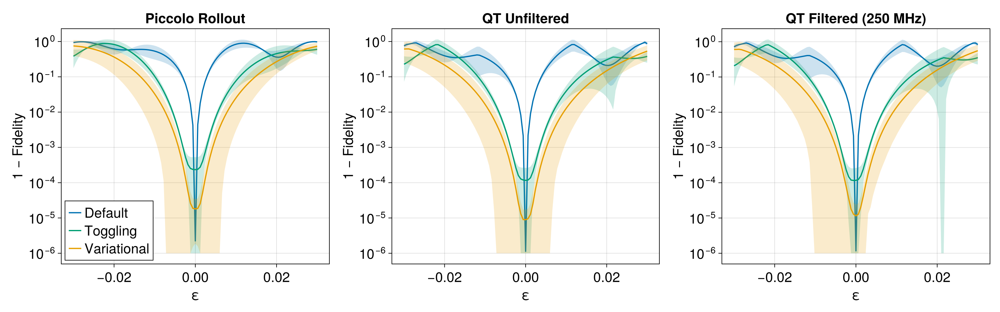

In [50]:
function plot_infidelity_band!(ax, εs, F_data; color, label, linewidth=2)
    μ = vec(mean(F_data, dims=1))
    σ = vec(std(F_data, dims=1))
    infid_μ = 1 .- μ
    # For log scale, clamp lower band to avoid negatives
    infid_lo = max.(1 .- (μ .+ σ), 1e-6)
    infid_hi = 1 .- (μ .- σ)

    band!(ax, εs, infid_lo, infid_hi; color=(color, 0.2))
    lines!(ax, εs, infid_μ; color=color, linewidth=linewidth, label=label)
end

fig = Figure(fontsize=22, size=(1600, 500))

for (col, (title, F_data)) in enumerate(zip(titles, data))
    ax = Axis(fig[1, col], xlabel="ε", ylabel="1 − Fidelity",
        title=title, yscale=log10)
    for mi in 1:3
        plot_infidelity_band!(ax, εs, F_data[mi, :, :];
            color=colors[mi], label=method_labels[mi])
    end
    if col == 1
        axislegend(ax, position=:lb)
    end
end

display(fig)
save(joinpath(outdir, "figs", "log_infidelity_band.png"), fig)

## 6. Robustness Metrics (across seeds)

Compute variational and toggling metrics for all seeds. Circles = mean, error bars = ±1 std,
faint dots = individual seeds.

In [51]:
function var_obj(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_errors::Vector{Matrix{ComplexF64}}
)
    Δt = traj.Δt[1]
    T = traj.T
    varsys = VariationalQuantumSystem(H_drives, H_errors)
    Ũ⃗, ∂Ũ⃗ = variational_unitary_rollout(traj, varsys)

    U = iso_vec_to_operator(Ũ⃗[:, end])
    ∂U = iso_vec_to_operator(∂Ũ⃗[1][:, end])

    d = size(U, 1)
    return abs(tr((U'*∂U)'*(U'*∂U))) / (T * Δt)^2 / d
end

function tog_obj(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_error::Matrix{ComplexF64}
)
    T = traj.T
    Δt = get_timesteps(traj)

    sys = QuantumSystem(H_drives)
    U = iso_vec_to_operator.(eachcol(unitary_rollout(traj, sys)))

    H_ti = sum(Δt[i] .* U[i]' * H_error * U[i] for i=1:T-1)

    d₁ = size(U[1], 1)
    Δt₁ = Δt[1]
    return norm(tr(H_ti'H_ti)) / (T * Δt₁)^2 / d₁
end

function upsample_constant_controls(vals::AbstractArray; factor::Int=2)
    return repeat(vals, inner=factor)
end

function upsample_matrix(controls::AbstractArray, dts::AbstractArray; factor::Int=2)
    new_controls = []
    for c in eachrow(controls)
        push!(new_controls, upsample_constant_controls(c; factor=factor))
    end
    T = length(controls[1,:])
    dts_up = dts[1] / factor .* ones(length(dts) * factor * T)
    new_controls = reduce(vcat, [v' for v in new_controls])
    return new_controls, dts_up
end

function tog_obj_upsample(
    traj::NamedTrajectory,
    H_drives::Vector{Matrix{ComplexF64}},
    H_error::Matrix{ComplexF64};
    factor::Int=1
)
    T = traj.T * factor
    a_new, Δt_new = upsample_matrix(traj.a, traj.Δt; factor=factor)

    sys = QuantumSystem(H_drives)
    U = iso_vec_to_operator.(eachcol(unitary_rollout(a_new, Δt_new, sys)))

    H_ti = sum(Δt_new[i] .* U[i]' * H_error * U[i] for i = 1:(traj.T - 1) * factor)

    d₁ = size(U[1], 1)
    Δt₁ = Δt_new[1]
    return norm(tr(H_ti'H_ti)) / (T * Δt₁)^2 / d₁
end

tog_obj_upsample (generic function with 1 method)

In [52]:
H_err = PAULIS.Z
upsample_factor = 2^10

var_vals = zeros(3, n_seeds)
tog_vals = zeros(3, n_seeds)
tog_vals_up = zeros(3, n_seeds)

for si in 1:n_seeds
    println("Computing metrics for seed $(seeds[si])...")
    for mi in 1:3
        traj = all_trajs[mi, si]
        var_vals[mi, si] = var_obj(traj, H_drive, [H_err])
        tog_vals[mi, si] = tog_obj(traj, H_drive, H_err)
        tog_vals_up[mi, si] = tog_obj_upsample(traj, H_drive, H_err; factor=upsample_factor)
    end
end

println("\nMetric computation complete.")

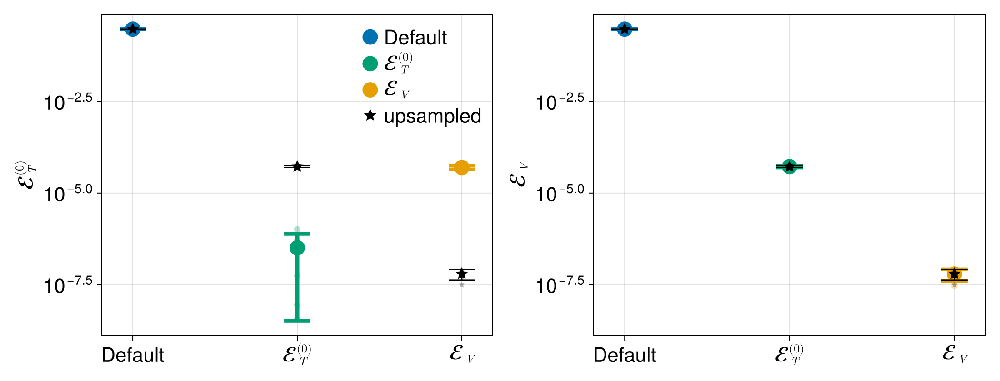

In [53]:
using LaTeXStrings                                                                                                                                                                                    
                                                                                                                                                                                                        
  colors = [Makie.wong_colors()[1], Makie.wong_colors()[3], Makie.wong_colors()[2]]                                                                                                                     
  xtick_labels = ["Default", L"\mathcal{E}_T^{(0)}", L"\mathcal{E}_V"]                                                                                                                                  
                                                                                                                                                                                                        
  var_μ = vec(mean(var_vals, dims=2))                                                                                                                                                                   
  var_σ = vec(std(var_vals, dims=2))                                                                                                                                                                    
  tog_μ = vec(mean(tog_vals, dims=2))                                                                                                                                                                   
  tog_σ = vec(std(tog_vals, dims=2))
  tog_up_μ = vec(mean(tog_vals_up, dims=2))                                                                                                                                                             
  tog_up_σ = vec(std(tog_vals_up, dims=2))

  # Clamp lower error bars so they stay positive on log scale
  tog_lo = max.(tog_μ .- tog_σ, tog_μ .* 0.01)
  var_lo = max.(var_μ .- var_σ, var_μ .* 0.01)                                                                                                                                                           
  tog_up_lo = max.(tog_up_μ .- tog_up_σ, tog_up_μ .* 0.01)                                                                                                                                               
                                                                                                                                                                                                        
  # Whisker half-width (same for all)                                                                                                                                                                   
  w = 0.08        
                                                                                                                                                                                                        
  fig = Figure(size=(1100, 420), fontsize=22)                                                                                                                                                           
   
  function add_caps!(ax, x, lo, hi, col; lw=4.0)                                                                                                                                                        
      linesegments!(ax, [Point2f(x - w, lo), Point2f(x + w, lo)]; color=col, linewidth=lw)
      linesegments!(ax, [Point2f(x - w, hi), Point2f(x + w, hi)]; color=col, linewidth=lw)                                                                                                              
  end                                                                                                                                                                                                   
                                                                                                                                                                                                        
  # Toggling metric                                                                                                                                                                                     
  ax_tog = Axis(fig[1, 1], ylabel=L"\mathcal{E}_T^{(0)}", yscale=log10)
  for si in 1:n_seeds                                                                                                                                                                                   
      scatter!(ax_tog, 1:3, tog_vals[:, si];                                                                                                                                                            
          color=[(c, 0.3) for c in colors], markersize=10)                                                                                                                                              
  end                                                                                                                                                                                                   
  for mi in 1:3   
      hi = tog_μ[mi] + tog_σ[mi]                                                                                                                                                                        
      rangebars!(ax_tog, [mi], [tog_lo[mi]], [hi]; color=colors[mi], linewidth=4.5)
      add_caps!(ax_tog, mi, tog_lo[mi], hi, colors[mi])                                                                                                                                                 
  end
  scatter!(ax_tog, 1:3, tog_μ; color=colors, markersize=24, strokewidth=0)                                                                                                                              
  for si in 1:n_seeds                                                                                                                                                                                   
      scatter!(ax_tog, 1:3, tog_vals_up[:, si];
          color=[(:black, 0.3) for _ in 1:3], markersize=8, marker=:star5)                                                                                                                              
  end                                                                                                                                                                                                   
  for mi in 1:3
      hi = tog_up_μ[mi] + tog_up_σ[mi]                                                                                                                                                                  
      rangebars!(ax_tog, [mi], [tog_up_lo[mi]], [hi]; color=:black, linewidth=1.5)
      add_caps!(ax_tog, mi, tog_up_lo[mi], hi, :black; lw=1.5)                                                                                                                                          
  end
  scatter!(ax_tog, 1:3, tog_up_μ; marker=:star5, color=:black, markersize=16)                                                                                                                           
  ax_tog.xticks = (1:3, xtick_labels)                                                                                                                                                                   
   
  # Variational metric                                                                                                                                                                                  
  ax_var = Axis(fig[1, 2], ylabel=L"\mathcal{E}_V", yscale=log10)
  for si in 1:n_seeds                                                                                                                                                                                   
      scatter!(ax_var, 1:3, var_vals[:, si];
          color=[(c, 0.3) for c in colors], markersize=10)                                                                                                                                              
  end                                                                                                                                                                                                   
  for mi in 1:3
      hi = var_μ[mi] + var_σ[mi]                                                                                                                                                                        
      rangebars!(ax_var, [mi], [var_lo[mi]], [hi]; color=colors[mi], linewidth=4.5)
      add_caps!(ax_var, mi, var_lo[mi], hi, colors[mi])                                                                                                                                                 
  end
  scatter!(ax_var, 1:3, var_μ; color=colors, markersize=24, strokewidth=0)                                                                                                                              
  for si in 1:n_seeds                                                                                                                                                                                   
      scatter!(ax_var, 1:3, tog_vals_up[:, si];
          color=[(:black, 0.3) for _ in 1:3], markersize=8, marker=:star5)                                                                                                                              
  end                                                                                                                                                                                                   
  for mi in 1:3
      hi = tog_up_μ[mi] + tog_up_σ[mi]                                                                                                                                                                  
      rangebars!(ax_var, [mi], [tog_up_lo[mi]], [hi]; color=:black, linewidth=1.5)
      add_caps!(ax_var, mi, tog_up_lo[mi], hi, :black; lw=1.5)                                                                                                                                          
  end
  scatter!(ax_var, 1:3, tog_up_μ; marker=:star5, color=:black, markersize=16)                                                                                                                           
  ax_var.xticks = (1:3, xtick_labels)                                                                                                                                                                   
   
  linkyaxes!(ax_tog, ax_var)                                                                                                                                                                            
  ylims!(ax_tog, 1e-8, 1e-1)
                                                                                                                                                                                                        
  handles = [
      Makie.MarkerElement(marker=:circle, color=colors[1], markersize=24, strokewidth=0),                                                                                                               
      Makie.MarkerElement(marker=:circle, color=colors[2], markersize=24, strokewidth=0),
      Makie.MarkerElement(marker=:circle, color=colors[3], markersize=24, strokewidth=0),                                                                                                               
      Makie.MarkerElement(marker=:star5, color=:black, markersize=16),
  ]                                                                                                                                                                                                     
  leg_labels = ["Default", L"\mathcal{E}_T^{(0)}", L"\mathcal{E}_V", "upsampled"]
  axislegend(ax_tog, handles, leg_labels; position=:rt, framevisible=false)                                                                                                                             
                                                                                                                                                                                                        
  save(joinpath(outdir, "figs", "robustness_metrics.png"), fig)
  display(fig)                                                                                                                                                                                          
                  
  println("=== Robustness Metrics (mean ± std over $(n_seeds) seeds) ===")                                                                                                                              
  println()
  for (mi, label) in enumerate(["Default", "Toggling", "Variational"])                                                                                                                                  
      println("$label:")
      println("  E_T     = $(round(tog_μ[mi], sigdigits=4)) ± $(round(tog_σ[mi], sigdigits=4))")
      println("  E_T(up) = $(round(tog_up_μ[mi], sigdigits=4)) ± $(round(tog_up_σ[mi], sigdigits=4))")                                                                                                  
      println("  E_V     = $(round(var_μ[mi], sigdigits=4)) ± $(round(var_σ[mi], sigdigits=4))")                                                                                                        
  end                

## 7. Summary Statistics

Print per-method statistics at ε=0 across all seeds.

In [54]:
mid = n_eps ÷ 2 + 1  # index for ε ≈ 0

println("=== Fidelity at ε ≈ 0 across $(n_seeds) seeds ===")
println()

for (mi, label) in enumerate(method_labels)
    println("--- $label ---")
    for (vname, F_data) in [("Piccolo", F_piccolo), ("QT unfilt", F_qt_unfilt), ("QT filt", F_qt_filt)]
        vals = F_data[mi, :, mid]
        println("  $vname: mean=$(round(mean(vals), digits=8)), " *
                "std=$(round(std(vals), digits=8)), " *
                "min=$(round(minimum(vals), digits=8)), " *
                "max=$(round(maximum(vals), digits=8))")
    end
    println()
end

### Bloch Sphere Trajectories (per seed)

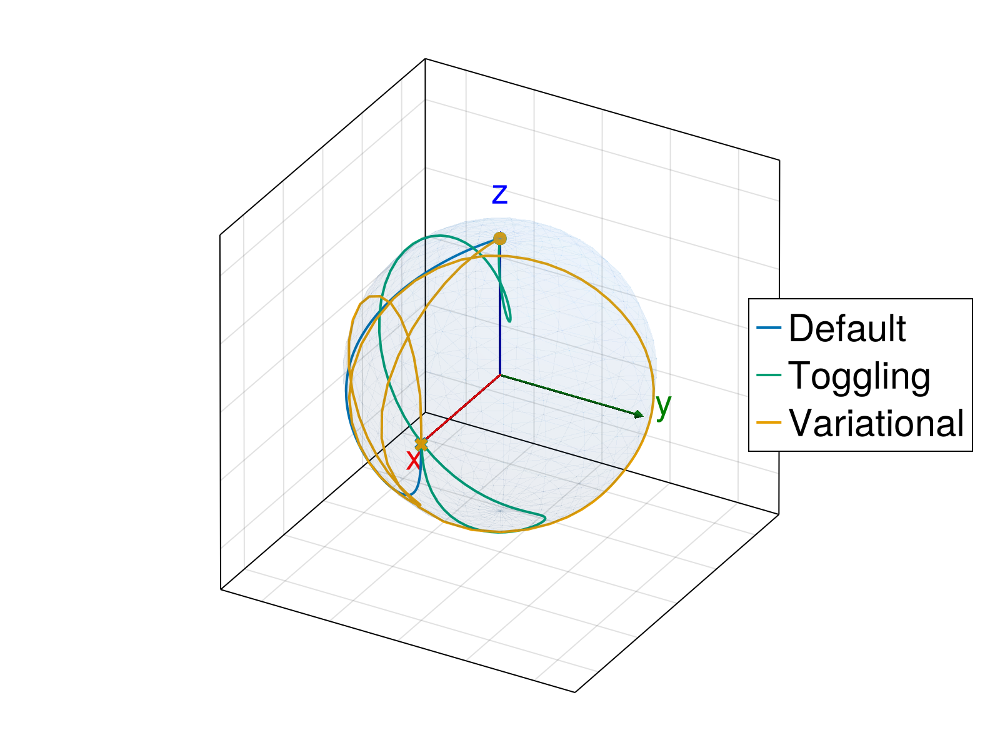

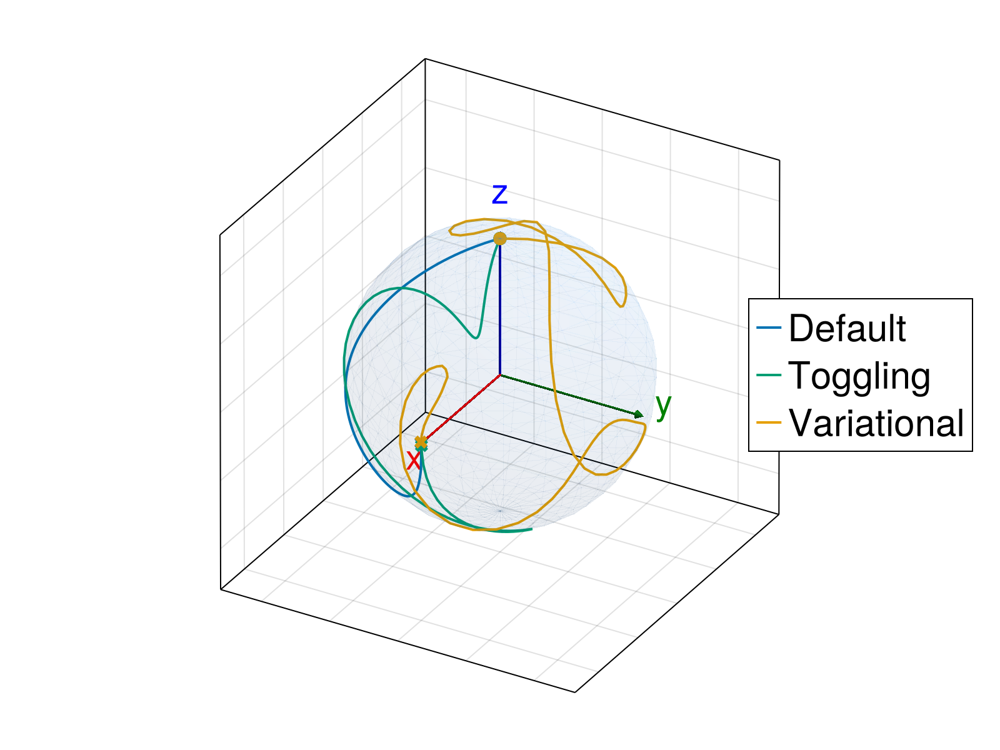

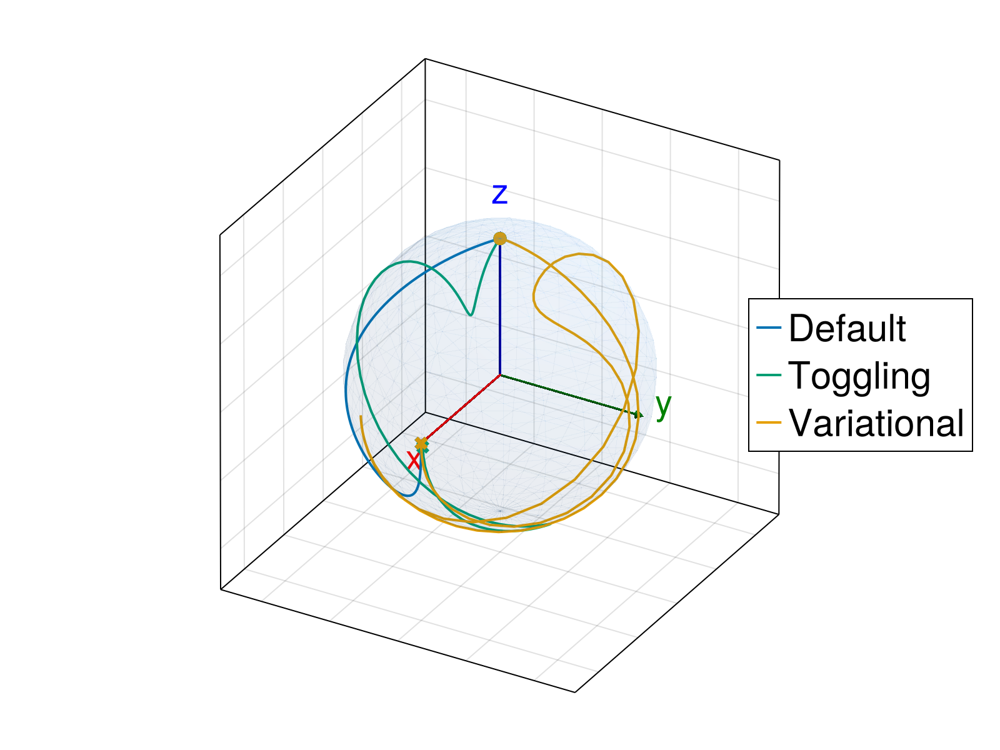

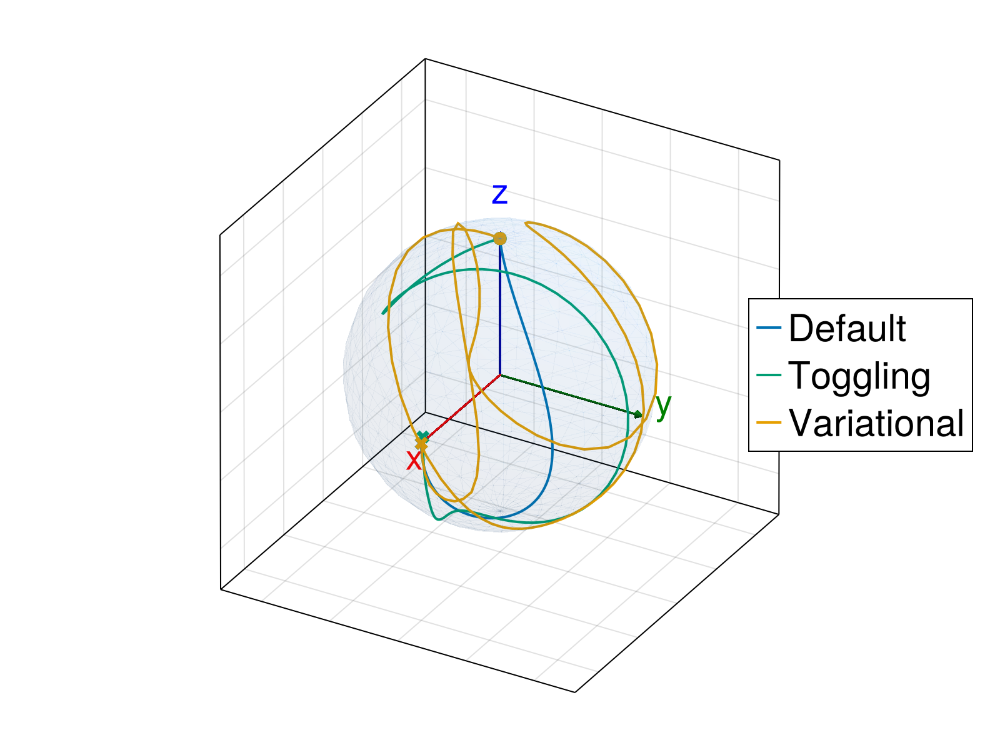

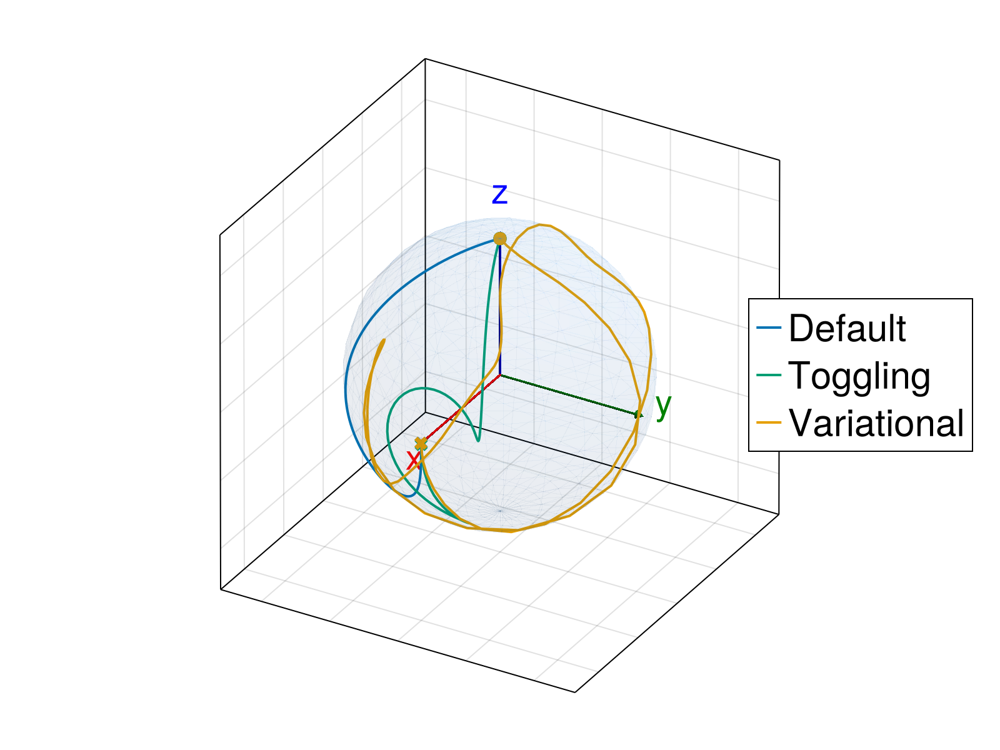

In [55]:
using GeometryBasics

mkpath(joinpath(outdir, "figs", "bloch_trajectories"))

bloch_colors = [Makie.wong_colors()[1], Makie.wong_colors()[3], Makie.wong_colors()[2]]
bloch_labels = ["Default", "Toggling", "Variational"]
ket_0 = [1.0, 0.0]
rho_0 = ket_0 * ket_0'

for si in 1:n_seeds
    f = CairoMakie.Figure(resolution=(800, 600))
    ax = CairoMakie.Axis3(f[1, 1]; aspect=:equal)

    origins = [Point3f(0,0,0), Point3f(0,0,0), Point3f(0,0,0)]
    dirs    = [Vec3f(1.0,0,0), Vec3f(0,1.0,0), Vec3f(0,0,1.0)]

    CairoMakie.arrows!(ax, origins, dirs;
        color=[:red, :green, :blue], arrowsize=0.05, linewidth=0.01)

    CairoMakie.text!(ax, "x", position=Point3f(1.2, 0, 0), align=(:left, :center),  color=:red,   fontsize=28)
    CairoMakie.text!(ax, "y", position=Point3f(0, 1.2, 0), align=(:center, :bottom), color=:green, fontsize=28)
    CairoMakie.text!(ax, "z", position=Point3f(0, 0, 1.2), align=(:center, :bottom), color=:blue,  fontsize=28)

    for mi in 1:3
        traj = all_trajs[mi, si]

        expect_val_x = [real(tr(PAULIS.X * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]
        expect_val_y = [real(tr(PAULIS.Y * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]
        expect_val_z = [real(tr(PAULIS.Z * iso_vec_to_operator(traj.Ũ⃗[:, t]) * rho_0 * iso_vec_to_operator(traj.Ũ⃗[:, t])')) for t in 1:traj.T]

        CairoMakie.lines!(ax, real.(expect_val_x), real.(expect_val_y), real.(expect_val_z);
            color=bloch_colors[mi], label=bloch_labels[mi], linewidth=2.0)

        CairoMakie.scatter!(ax, [real(expect_val_x[end])], [real(expect_val_y[end])], [real(expect_val_z[end])];
            color=bloch_colors[mi], markersize=15, marker=:xcross)
        CairoMakie.scatter!(ax, [real(expect_val_x[1])], [real(expect_val_y[1])], [real(expect_val_z[1])];
            color=bloch_colors[mi], markersize=15)
    end

    CairoMakie.mesh!(ax, Sphere(Point3f(0,0,0), 1f0);
        color=(0.2, 0.6, 1.0, 0.05),
        transparency=true,
        shading=true
    )

    CairoMakie.xlims!(ax, -1.3, 1.3)
    CairoMakie.ylims!(ax, -1.3, 1.3)
    CairoMakie.zlims!(ax, -1.3, 1.3)

    ax.azimuth[]   = π/6
    ax.elevation[] = π/6

    CairoMakie.hidexdecorations!(ax, grid=false)
    CairoMakie.hideydecorations!(ax, grid=false)
    CairoMakie.hidezdecorations!(ax, grid=false)

    CairoMakie.axislegend(ax; position=:rc, labelsize=30)

    save(joinpath(outdir, "figs", "bloch_trajectories", "bloch_seed$(seeds[si]).png"), f)
    display(f)
end

### Control Plots (per seed, coarse vs filtered)

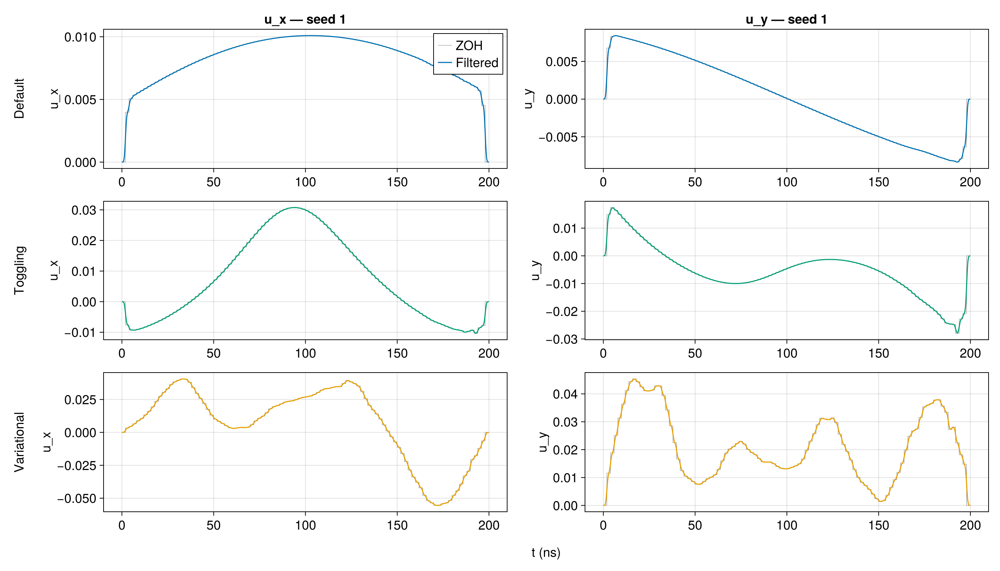

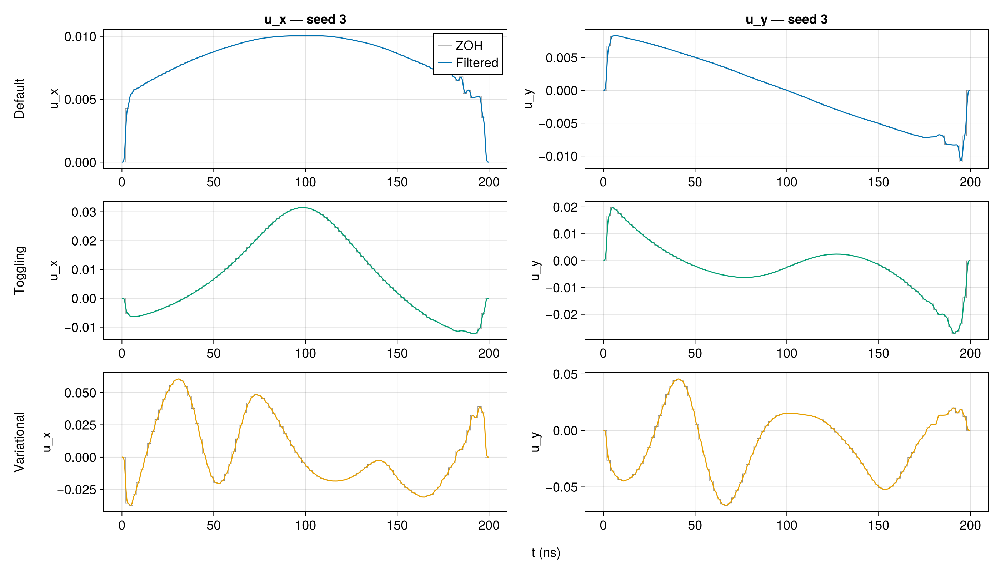

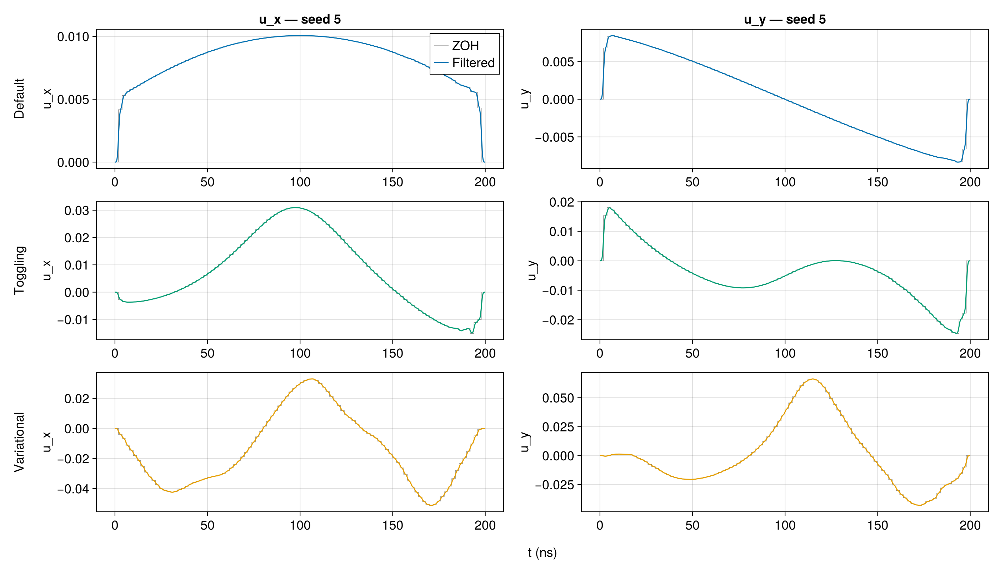

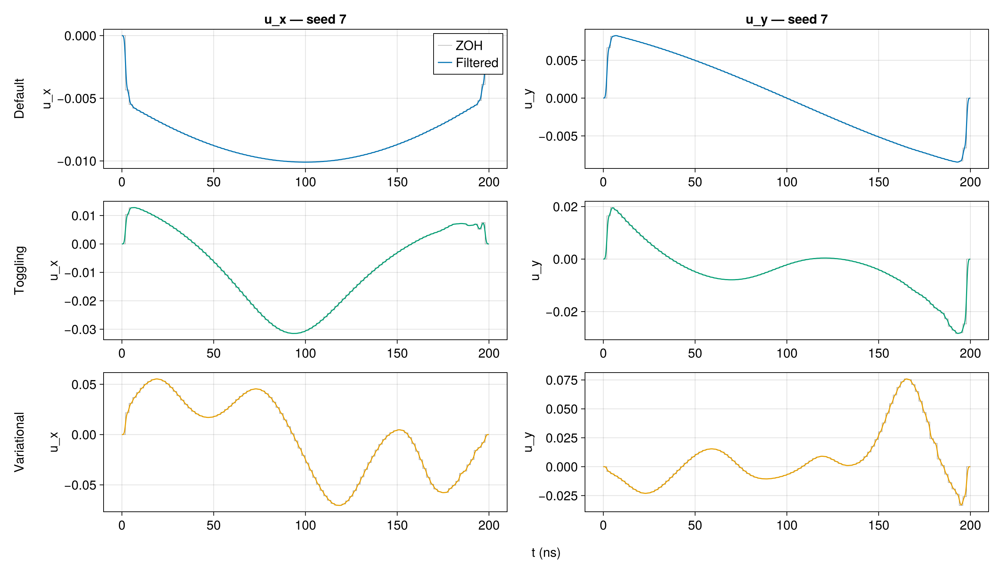

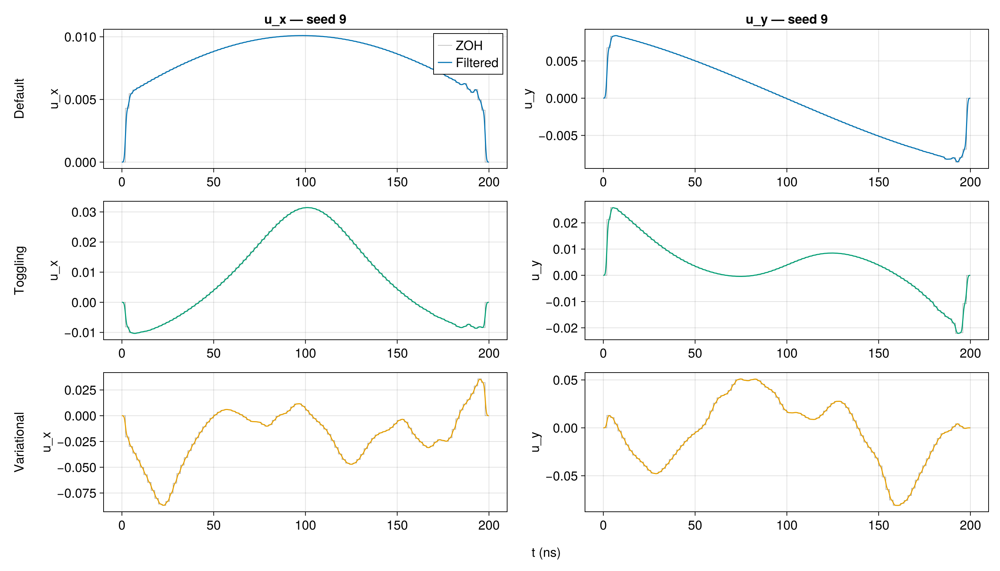

In [56]:
mkpath(joinpath(outdir, "figs", "controls"))

method_names = ["Default", "Toggling", "Variational"]

for si in 1:n_seeds
    fig = Figure(fontsize=18, size=(1400, 800))

    for (mi, mname) in enumerate(method_names)
        traj = all_trajs[mi, si]
        ux_c = traj.a[1, :]
        uy_c = traj.a[2, :]
        dt_ns = Float64(traj.Δt[1])

        ux_f, uy_f, dt_fine = apply_gaussian_filter(ux_c, uy_c;
            dt_ns=dt_ns, M=M_upsample, B3dB_Hz=B3dB)

        Nc = length(ux_c)
        Nf = length(ux_f)
        t_f = (0:Nf-1) .* dt_fine

        ax_x = Axis(fig[mi, 1], ylabel="u_x",
            title=(mi == 1 ? "u_x — seed $(seeds[si])" : ""))
        stairs!(ax_x, t_f, repeat(ux_c, inner=(M_upsample,)), label="ZOH", color=:gray, linewidth=0.5)
        lines!(ax_x, t_f, ux_f, label="Filtered", linewidth=1.5, color=colors[mi])
        if mi == 1; axislegend(ax_x, position=:rt); end

        ax_y = Axis(fig[mi, 2], ylabel="u_y",
            title=(mi == 1 ? "u_y — seed $(seeds[si])" : ""))
        stairs!(ax_y, t_f, repeat(uy_c, inner=(M_upsample,)), color=:gray, linewidth=0.5)
        lines!(ax_y, t_f, uy_f, linewidth=1.5, color=colors[mi])

        # Row label
        Label(fig[mi, 0], mname, rotation=π/2, fontsize=18, tellheight=false)
    end

    # Shared x label
    Label(fig[end+1, 1:2], "t (ns)", fontsize=18)

    save(joinpath(outdir, "figs", "controls", "controls_seed$(seeds[si]).png"), fig)
    display(fig)
end

## 8. Save Results

In [57]:
using DelimitedFiles

outdir = "no_Z_multiseed"
mkpath(outdir)
mkpath(joinpath(outdir, "controls"))
mkpath(joinpath(outdir, "figs"))

# ── 1. Save fidelity arrays ──
for (fname, F_data) in [("F_piccolo.csv", F_piccolo),
                         ("F_qt_unfilt.csv", F_qt_unfilt),
                         ("F_qt_filt.csv", F_qt_filt)]
    open(joinpath(outdir, fname), "w") do io
        println(io, "# methods: Default=1, Toggling=2, Variational=3")
        println(io, "# shape: [3, $(n_seeds), $(n_eps)]")
        println(io, "# seeds: $(seeds)")
        println(io, "# εs: $(εs[1]):$(εs[2]-εs[1]):$(εs[end])")
        for mi in 1:3
            for si in 1:n_seeds
                writedlm(io, F_data[mi, si, :]', ',')
            end
        end
    end
end

# ── 2. Save per-seed robustness metrics ──
metrics_out = Matrix{Any}(undef, 1 + 3 * n_seeds, 5)
metrics_out[1, :] = ["method", "seed", "var_obj", "tog_obj", "tog_obj_upsampled"]
row = 2
for (mi, label) in enumerate(["default", "toggling", "variational"])
    for si in 1:n_seeds
        metrics_out[row, :] = [label, seeds[si], var_vals[mi, si], tog_vals[mi, si], tog_vals_up[mi, si]]
        row += 1
    end
end
writedlm(joinpath(outdir, "robustness_metrics_per_seed.csv"), metrics_out, ',')

# ── 3. Save per-seed controls ──
method_names = ["default", "toggling", "variational"]

function write_controls_csv(path::AbstractString, A::AbstractMatrix; dt_ns::Real=2.0)
    nch, nT = size(A)
    times = collect(0:dt_ns:dt_ns*(nT-1))
    labels = nch == 2 ? ["u_x", "u_y"] : ["u_x", "u_y", "u_z"]
    out = Matrix{Any}(undef, 1 + nch, 1 + nT)
    out[1, 1] = "time (ns)"
    out[1, 2:end] .= times
    for i in 1:nch
        out[1 + i, 1] = labels[i]
        out[1 + i, 2:end] .= vec(A[i, :])
    end
    writedlm(path, out, ',')
end

for si in 1:n_seeds
    for (mi, mname) in enumerate(method_names)
        traj = all_trajs[mi, si]
        fname = "$(mname)_seed$(seeds[si]).csv"
        write_controls_csv(joinpath(outdir, "controls", fname), Matrix(traj.a); dt_ns=Δt)
    end
end

# ── 4. Save per-seed fidelity curves ──
# One CSV per seed with columns: ε, def_piccolo, tog_piccolo, var_piccolo, def_qt_unfilt, ...
for si in 1:n_seeds
    open(joinpath(outdir, "fidelity_seed$(seeds[si]).csv"), "w") do io
        println(io, "epsilon,def_piccolo,tog_piccolo,var_piccolo,def_qt_unfilt,tog_qt_unfilt,var_qt_unfilt,def_qt_filt,tog_qt_filt,var_qt_filt")
        for ei in 1:n_eps
            vals = [εs[ei],
                    F_piccolo[1,si,ei], F_piccolo[2,si,ei], F_piccolo[3,si,ei],
                    F_qt_unfilt[1,si,ei], F_qt_unfilt[2,si,ei], F_qt_unfilt[3,si,ei],
                    F_qt_filt[1,si,ei], F_qt_filt[2,si,ei], F_qt_filt[3,si,ei]]
            println(io, join(vals, ","))
        end
    end
end

println("Saved to: ", abspath(outdir))
println("  controls/  — per-seed control CSVs")
println("  fidelity_seed*.csv — per-seed fidelity curves")
println("  robustness_metrics_per_seed.csv")
println("  F_piccolo.csv, F_qt_unfilt.csv, F_qt_filt.csv")